# **DUST FORCAST**

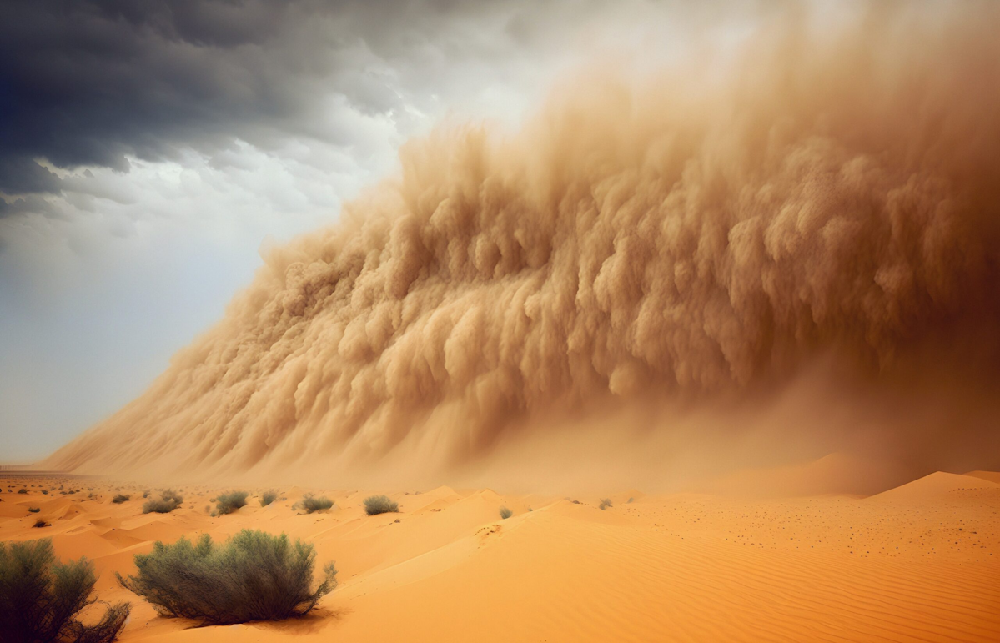

# Utils

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install celluloid
# pip install torch_sparse
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.4 MB/s eta 0:00:00


In [ ]:
!pip install torch-geometric --upgrade

In [ ]:
# Imports
import h5py
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import torch
import random as rand

from IPython.display import HTML
from celluloid import Camera
from scipy.spatial import Delaunay
from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from torch_geometric.data import Data
from scipy.spatial import ConvexHull

import torch.nn as nn
import torch.optim as optim
from torch_geometric.nn import GCNConv
from torch_geometric.nn import SAGEConv
from sklearn.metrics import roc_auc_score
from torch_geometric.transforms import NormalizeFeatures

from sklearn.model_selection import cross_val_score
from hyperopt import fmin, tpe, hp, Trials
from hyperopt.pyll.base import scope

In [ ]:
def delaunay_graph(points):

    tri = Delaunay(points)

    edges = []
    for simplex in tri.simplices:
        # for combination of numbers
        for i in range(len(simplex)):
            j = (i + 1) % len(simplex)
            edges.append((simplex[i], simplex[j]))

    return edges

def get_convex_hull_edges(points):
    hull = ConvexHull(points)
    edges = [(hull.vertices[i], hull.vertices[i+1]) for i in range(len(hull.vertices) - 1)]
    edges.append([hull.vertices[-1], hull.vertices[0]])  # Add the last edge
    return edges

In [ ]:
def intersect(tensor1, tensor2):
    """
    Finds the intersection of two tensors.

    Args:
        tensor1: The first tensor.
        tensor2: The second tensor.

    Returns:
        A tensor containing the elements that are common to both tensors.
    """

    unique_elements, counts = torch.unique(torch.cat([tensor1, tensor2]), return_counts=True)
    intersection_indices = (counts > 1).nonzero().squeeze(1)
    intersection = unique_elements[intersection_indices]
    return intersection

In [ ]:
def make_edge_index_undirected(edge_index):
    """Makes an edge index symmetric and undirected.

    Args:
        edge_index (torch.Tensor): The original edge index tensor.

    Returns:
        torch.Tensor: Sorted undirected edge index tensor.
    """

    # Concatenate the original edge index and its transpose
    edge_index = torch.cat([edge_index, edge_index.flip(dims=[1])], dim=0)
    edge_index = edge_index.unique(dim=0)

    return edge_index

In [ ]:
def combine_reindex(pyg_graphs, max_random_link_num, train_len=240, valid_len=12, test_len=12, split = False):
  """
  combines pyg graphs into one graph
  it resets the edge_indexes in each subgraph(train,test,valid)
  Args:
    pyg_graphs: list of pyg graphs
    max_random_link_num: max number of edges between two graphs
    split: if it should be splitted into train and test and valid sets

  Returns: combined graph / train graph, valid graph, test graph

  """
  if split:

    combined_graph_train = Data(x=pyg_graphs[0].x,
                      y=pyg_graphs[0].y,
                      pos=pyg_graphs[0].pos,
                      edge_index=pyg_graphs[0].edge_index,
                      num_nodes=pyg_graphs[0].num_nodes)

    combined_graph_valid = Data(x=pyg_graphs[train_len].x,
                      y=pyg_graphs[train_len].y,
                      pos=pyg_graphs[train_len].pos,
                      edge_index=pyg_graphs[train_len].edge_index,
                      num_nodes=pyg_graphs[train_len].num_nodes)

    combined_graph_test = Data(x=pyg_graphs[train_len+valid_len].x,
                      y=pyg_graphs[train_len+valid_len].y,
                      pos=pyg_graphs[train_len+valid_len].pos,
                      edge_index=pyg_graphs[train_len+valid_len].edge_index,
                      num_nodes=pyg_graphs[train_len+valid_len].num_nodes)

    current_index = 0
    train_flag = True
    valid_flag = False
    test_flag = False
    blip = True
    # blip_num_node = 0

    for i in range(1, len(pyg_graphs)):

      first_graph = pyg_graphs[i-1]
      sec_graph = pyg_graphs[i]

      start_index = current_index
      current_index += first_graph.num_nodes
      end_index = current_index + sec_graph.num_nodes

      if i == train_len:
        train_flag = False
        valid_flag = True
        blip = False
        current_index = 0
        # blip_num_node = combined_graph_train.num_nodes

      if i == train_len+valid_len:
        valid_flag = False
        test_flag = True
        blip = False
        current_index = 0
        # blip_num_node = combined_graph_train.num_nodes+combined_graph_valid.num_nodes

      if blip:
        if train_flag:

          combined_graph_train.x = torch.cat([combined_graph_train.x, sec_graph.x], dim=0)
          combined_graph_train.y = torch.cat([combined_graph_train.y, sec_graph.y], dim=0)
          combined_graph_train.pos = torch.cat([combined_graph_train.pos, sec_graph.pos], dim=0)
          combined_graph_train.num_nodes += sec_graph.num_nodes

          # combined_graph_train.edge_index = torch.cat([combined_graph_train.edge_index, sec_graph.edge_index+first_graph.num_nodes+blip_num_node], dim=0)
          combined_graph_train.edge_index = torch.cat([combined_graph_train.edge_index, sec_graph.edge_index+first_graph.num_nodes], dim=0)

          # random edges between two graphs
          link_edges = make_edge_index_undirected(torch.tensor([rand.sample(range(start_index, current_index), max_random_link_num),
                                                                rand.sample(range(current_index, end_index), max_random_link_num)], dtype=torch.int64).t())

          combined_graph_train.edge_index = torch.cat([combined_graph_train.edge_index, link_edges], dim=0)

        elif valid_flag:
          combined_graph_valid.x = torch.cat([combined_graph_valid.x, sec_graph.x], dim=0)
          combined_graph_valid.y = torch.cat([combined_graph_valid.y, sec_graph.y], dim=0)
          combined_graph_valid.pos = torch.cat([combined_graph_valid.pos, sec_graph.pos], dim=0)
          combined_graph_valid.num_nodes += sec_graph.num_nodes

          # combined_graph_valid.edge_index = torch.cat([combined_graph_valid.edge_index, sec_graph.edge_index+first_graph.num_nodes+blip_num_node], dim=0)
          combined_graph_valid.edge_index = torch.cat([combined_graph_valid.edge_index, sec_graph.edge_index+first_graph.num_nodes], dim=0)

          # random edges between two graphs
          link_edges = make_edge_index_undirected(torch.tensor([rand.sample(range(start_index, current_index), max_random_link_num),
                                                                rand.sample(range(current_index, end_index), max_random_link_num)], dtype=torch.int64).t())

          combined_graph_valid.edge_index = torch.cat([combined_graph_valid.edge_index, link_edges], dim=0)

        elif test_flag:

          combined_graph_test.x = torch.cat([combined_graph_test.x, sec_graph.x], dim=0)
          combined_graph_test.y = torch.cat([combined_graph_test.y, sec_graph.y], dim=0)
          combined_graph_test.pos = torch.cat([combined_graph_test.pos, sec_graph.pos], dim=0)
          combined_graph_test.num_nodes += sec_graph.num_nodes

          # combined_graph_test.edge_index = torch.cat([combined_graph_test.edge_index, sec_graph.edge_index+first_graph.num_nodes+blip_num_node], dim=0)
          combined_graph_test.edge_index = torch.cat([combined_graph_test.edge_index, sec_graph.edge_index+first_graph.num_nodes], dim=0)

          # random edges between two graphs

          link_edges = make_edge_index_undirected(torch.tensor([rand.sample(range(start_index, current_index), max_random_link_num),
                                                                rand.sample(range(current_index, end_index), max_random_link_num)], dtype=torch.int64).t())

          combined_graph_test.edge_index = torch.cat([combined_graph_test.edge_index, link_edges], dim=0)

      else:
        if valid_flag:
          combined_graph_valid = Data(x=pyg_graphs[train_len].x,
                            y=pyg_graphs[train_len].y,
                            pos=pyg_graphs[train_len].pos,
                            edge_index=pyg_graphs[train_len].edge_index,
                            num_nodes=pyg_graphs[train_len].num_nodes)

                            # edge_index=pyg_graphs[train_len].edge_index+combined_graph_train.num_nodes,

        elif test_flag:
          combined_graph_test = Data(x=pyg_graphs[train_len+valid_len].x,
                            y=pyg_graphs[train_len+valid_len].y,
                            pos=pyg_graphs[train_len+valid_len].pos,

                            edge_index=pyg_graphs[train_len+valid_len].edge_index,
                            num_nodes=pyg_graphs[train_len+valid_len].num_nodes)

                            # edge_index=pyg_graphs[train_len+valid_len].edge_index+combined_graph_train.num_nodes+combined_graph_valid.num_nodes,
      blip = True

    return combined_graph_train, combined_graph_valid, combined_graph_test

  else:
    combined_graph = Data(x=pyg_graphs[0].x,
                      y=pyg_graphs[0].y,
                      pos=pyg_graphs[0].pos,
                      edge_index=pyg_graphs[0].edge_index,
                      num_nodes=pyg_graphs[0].num_nodes)

    current_index = 0

    for i in range(1, len(pyg_graphs)):

      if len(pyg_graphs)>=2:

        first_graph = pyg_graphs[i-1]
        sec_graph = pyg_graphs[i]

        start_index = current_index
        current_index += first_graph.num_nodes
        end_index = current_index + sec_graph.num_nodes

        combined_graph.x = torch.cat([combined_graph.x, sec_graph.x], dim=0)
        combined_graph.y = torch.cat([combined_graph.y, sec_graph.y], dim=0)
        combined_graph.pos = torch.cat([combined_graph.pos, sec_graph.pos], dim=0)
        combined_graph.num_nodes += sec_graph.num_nodes

        combined_graph.edge_index = torch.cat([combined_graph.edge_index, sec_graph.edge_index+first_graph.num_nodes], dim=0)

        # random edges between two graphs
        link_edges = make_edge_index_undirected(torch.tensor([rand.sample(range(start_index, current_index), max_random_link_num),
                                                              rand.sample(range(current_index, end_index), max_random_link_num)], dtype=torch.int64).t())

        combined_graph.edge_index = torch.cat([combined_graph.edge_index, link_edges], dim=0)

      else:
        raise Exception("Pyg_graphs are less than 2")

    return combined_graph

# Loading the dataset

In [ ]:
# Ali or Mary
drive_name = "Mary"

if drive_name == "Ali":
  # Ali's Drive
  with h5py.File('/content/drive/MyDrive/Datas/Maryam/Copy of datavector_py.h5', 'r') as f:
      datavec = f['my_dataset']
      datavector = datavec[...]
      print(datavector)

  with h5py.File('/content/drive/MyDrive/Datas/Maryam/Copy of gtVector_py.h5', 'r') as f1:
      gtvec = f1['my_dataset']
      gtvector = gtvec[...]

  with h5py.File('/content/drive/MyDrive/Datas/Maryam/Copy of coordinateX_py.h5', 'r') as f2:
      datavec_x = f2['my_dataset']
      datavector_x = datavec_x[...]

  with h5py.File('/content/drive/MyDrive/Datas/Maryam/Copy of coordinateY_py.h5', 'r') as f3:
      datavec_y = f3['my_dataset']
      datavector_y = datavec_y[...]

elif drive_name == "Mary":
  # Maryam's Drive
  with h5py.File('/content/drive/MyDrive/datavector_py.h5', 'r') as f:
      datavec = f['my_dataset']
      datavector = datavec[...]
      print(datavector)

  with h5py.File('/content/drive/MyDrive/gtVector_py.h5', 'r') as f1:
      gtvec = f1['my_dataset']
      gtvector = gtvec[...]

  with h5py.File('/content/drive/MyDrive/coordinateX_py.h5', 'r') as f2:
      datavec_x = f2['my_dataset']
      datavector_x = datavec_x[...]

  with h5py.File('/content/drive/MyDrive/coordinateY_py.h5', 'r') as f3:
      datavec_y = f3['my_dataset']
      datavector_y = datavec_y[...]

[[151. 148. 147. ... 225. 231. 255.]
 [128.  85.  44. ...  38.  34.  43.]
 [123. 145.  63. ...  62.  58.  64.]
 ...
 [149.   6.  53. ... 255. 255. 245.]
 [235. 235. 236. ... 232. 232. 223.]
 [  8.  18.  12. ...   4.   6.   4.]]


## Transposing to get the right dims

In [ ]:
datavector_t = datavector.T
gtvector_t = gtvector.T
datavector_x_t = datavector_x.T
datavector_y_t = datavector_y.T

# Creating the coord array as we have x and y in seperate arrays
datavector_coord_t = np.array([[datavector_x_t[i][0], datavector_y_t[i][0]] for i in range(len(datavector_x_t))])

raw_data = {"features":datavector_t, "coords":datavector_coord_t, "labels":gtvector_t}

feature_names = ["LST", "NDVI", "Precipitation", "SM", "WS", "Clay", "Silt", "Sand", "Soil thickness", "Altitude", "Slop"]


In [ ]:
raw_data_train_f= raw_data["features"][:2497824]
raw_data_train_c= raw_data["coords"][:2497824]
raw_data_train_l= raw_data["labels"][:2497824]

raw_data_test_f= raw_data["features"][2497824:]
raw_data_test_c= raw_data["coords"][2497824:]
raw_data_test_l= raw_data["labels"][2497824:]


#  $Early EDA

In [ ]:
print("-------------------------------------------------")
print(f"Shape of datavector_t is:", raw_data["features"].shape)
print("2 of the datavector_t:")
print(raw_data["features"][:2])
print("datavector_t.describe:")
print(pd.DataFrame(raw_data["features"]).describe())
print("-------------------------------------------------")
print(f"Shape of gtvector_t is:", raw_data["labels"].shape)
print("2 of the gtvector_t:")
print(raw_data["labels"][:2])
print("gtvector_t.describe:")
print(pd.DataFrame(raw_data["labels"]).describe())
print("-------------------------------------------------")
print(f"Shape of datavector_coord_t is:", raw_data["coords"].shape)
print("2 of the datavector_coord_t:")
print(raw_data["coords"][:2])
print("datavector_coord_t.describe:")
print(pd.DataFrame(raw_data["coords"]).describe())
print("-------------------------------------------------")

-------------------------------------------------
Shape of datavector_t is: (2616768, 11)
2 of the datavector_t:
[[151. 128. 123.  40. 118. 152.  36.  81. 149. 235.   8.]
 [148.  85. 145.  48. 111. 145.  38.  81.   6. 235.  18.]]
datavector_t.describe:
                 0             1             2             3             4   \
count  2.616768e+06  2.616768e+06  2.616768e+06  2.616768e+06  2.616768e+06   
mean   1.897180e+02  3.681174e+01  1.546503e+01  4.533599e+00  1.711388e+02   
std    2.047864e+01  1.597813e+01  2.187794e+01  8.703025e+00  3.395555e+01   
min    3.100000e+01  0.000000e+00  0.000000e+00  0.000000e+00  2.400000e+01   
25%    1.764748e+02  2.800000e+01  0.000000e+00  0.000000e+00  1.480000e+02   
50%    1.899289e+02  3.300000e+01  5.292191e+00  1.000000e+00  1.727266e+02   
75%    2.030000e+02  4.100000e+01  2.400000e+01  5.000000e+00  1.962470e+02   
max    2.550000e+02  2.440000e+02  2.500000e+02  2.490000e+02  2.550000e+02   

                 5             6   

Number of 1s: 10760


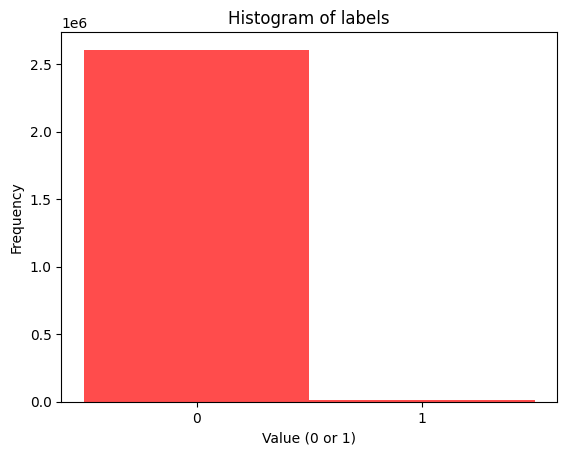

Dataset is heavily imbalanced!


In [ ]:
print(f"Number of 1s:", len(np.where(raw_data["labels"] == 1)[0]))

plt.hist(raw_data["labels"], bins=[-0.5, 0.5, 1.5], color='red', alpha=0.7)
plt.xlabel('Value (0 or 1)')
plt.ylabel('Frequency')
plt.title('Histogram of labels')
plt.xticks([0, 1])
plt.show()

print("Dataset is heavily imbalanced!")

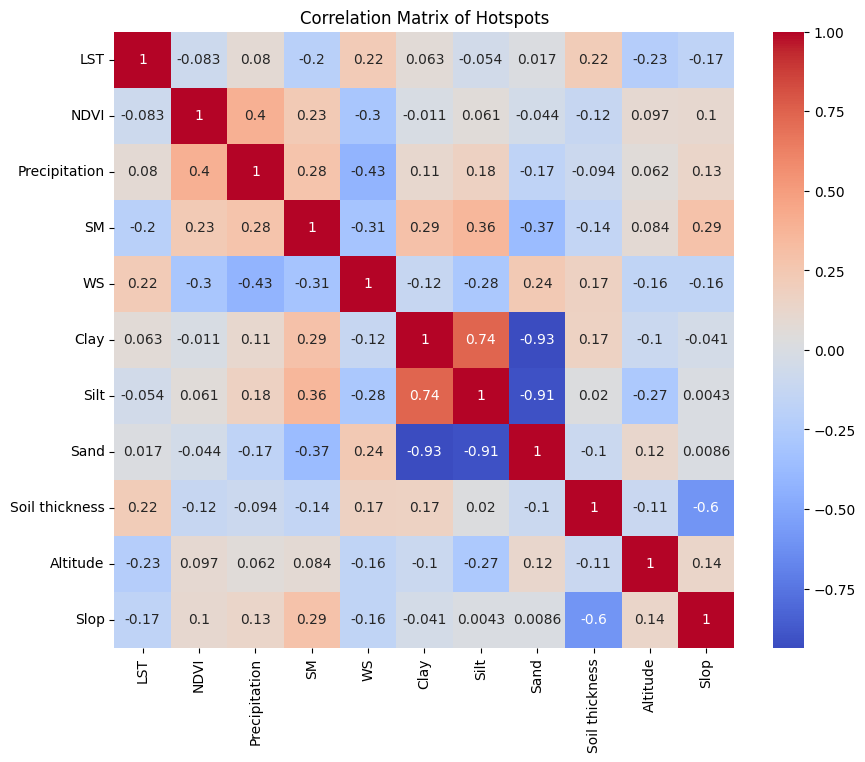

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(np.corrcoef(raw_data["features"].T), annot=True, cmap='coolwarm', xticklabels=feature_names, yticklabels=feature_names)
plt.title('Correlation Matrix of Hotspots')
plt.show()

# Partitioning the points in respect to months

In [ ]:
months = 264
datapoints_monthly_count = int(len(raw_data["features"])/months)
monthly_data = {"features":list(), "coords":list(),"labels":list()}

for i in tqdm(range(months)):
  monthly_data["features"].append(raw_data["features"][(i*datapoints_monthly_count):(i*datapoints_monthly_count)+datapoints_monthly_count])
  monthly_data["labels"].append(raw_data["labels"][(i*datapoints_monthly_count):(i*datapoints_monthly_count)+datapoints_monthly_count])
  monthly_data["coords"].append(raw_data["coords"][(i*datapoints_monthly_count):(i*datapoints_monthly_count)+datapoints_monthly_count])

100%|██████████| 264/264 [00:00<00:00, 194330.69it/s]


0


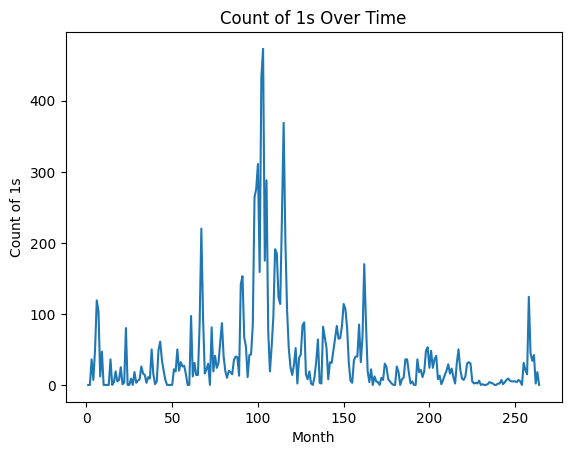

--------------------------------
Counts of 1s in month 110:
185


In [ ]:
counts = [len(np.where(monthly_data["labels"][i]==1)[0]) for i in range(264)]
print(min(counts))
plt.plot(range(1, 265), counts)
plt.xlabel("Month")
plt.ylabel("Count of 1s")
plt.title("Count of 1s Over Time")
plt.show()

print("--------------------------------")
i = 110
print(f"Counts of 1s in month {i}:")
print(len(np.where(monthly_data["labels"][i]==1)[0]))

In [ ]:
pd.DataFrame(counts).describe()

,0
count,264.000000
mean,40.757576
std,66.345005
min,0.000000
25%,5.000000
50%,19.000000
75%,45.500000
max,473.000000


# $Hotspots EDA based on features

In [ ]:
matplotlib.use('Agg')
from celluloid import Camera

fig, ax = plt.subplots(figsize=(15, 10))
camera = Camera(fig)

plt.xlim(np.min(monthly_data["coords"][0][:,0])-1, np.max(monthly_data["coords"][0][:,0])+1)
plt.ylim(np.min(monthly_data["coords"][0][:,1])-1, np.max(monthly_data["coords"][0][:,1])+1)
plt.xlabel("X-coordinate")
plt.ylabel("Y-coordinate")
plt.title(f"Hotspots over time")

month_till_index = 20
# feature_names = ["LST", "NDVI", "Precipitation", "SM", "WS", "Clay", "Silt", "Sand", "Soil thickness", "Altitude", "Slop"]
feature_index = 5

for frame in tqdm(range(month_till_index)):

    # Extract data for the current month
    total_ones_indxs = np.where(monthly_data["labels"][frame] == 1)[0]
    points = monthly_data["coords"][frame][total_ones_indxs]

    feature_value = monthly_data["features"][frame][:,feature_index]
    normalized_data = (feature_value - np.min(feature_value)) / (np.max(feature_value) - np.min(feature_value))
    cmap = plt.cm.inferno
    colors = cmap(normalized_data)

    bg_x = [p[0] for p in monthly_data["coords"][frame]]
    bg_y = [p[1] for p in monthly_data["coords"][frame]]
    plt.scatter(bg_x, bg_y, s=1, marker="s", c=colors, alpha=0.5, zorder=1)

    # Extract x and y coordinates
    x = [p[0] for p in points]
    y = [p[1] for p in points]
    plt.scatter(x, y, s=10, marker="o", color='blue', zorder=2)
    camera.snap()

anim = camera.animate(interval=1000, blit=True)
HTML(anim.to_html5_video())

100%|██████████| 20/20 [00:01<00:00, 13.96it/s]


In [ ]:
plt.clf()
%matplotlib inline

# Random selection for labels that are 0 in each month

In [ ]:
# Can do better by selecting the nearest 0s not any 0 and moving average 0s

min_sample_each_month = 5

random_sampled_monthly_data = {"features":list(), "coords":list(), "labels":list()}

for i in tqdm(range(264)):

  total_zeros_indxs = np.where(monthly_data["labels"][i]==0)[0]
  total_ones_indxs = np.where(monthly_data["labels"][i]==1)[0]

  # simple pure random
  if len(total_ones_indxs) > min_sample_each_month:

    random_zero_indxes = random.sample(list(total_zeros_indxs), len(total_ones_indxs))
  else:
    random_zero_indxes = random.sample(list(total_zeros_indxs), min_sample_each_month)

  # merging ones and zeros
  merged_indices = np.concatenate((total_ones_indxs, random_zero_indxes))
  #shuffling indxes
  random.shuffle(merged_indices)

  random_sampled_monthly_data["features"].append(monthly_data["features"][i][merged_indices])
  random_sampled_monthly_data["coords"].append(monthly_data["coords"][i][merged_indices])
  random_sampled_monthly_data["labels"].append(monthly_data["labels"][i][merged_indices])

100%|██████████| 264/264 [00:00<00:00, 1211.25it/s]


5


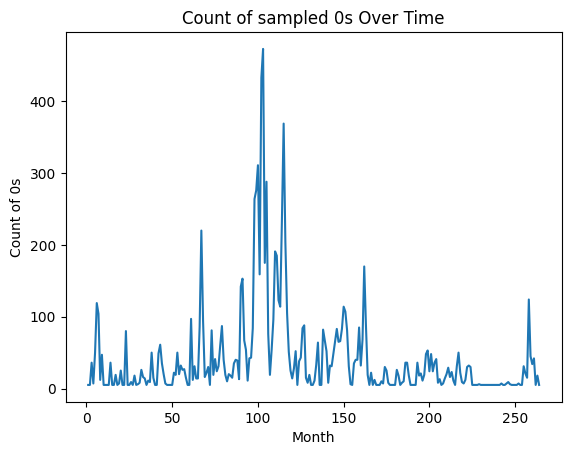

--------------------------------
Counts of 1s in month 1:
0
Counts of 0s in month 1:
5


In [ ]:
counts = [len(np.where(random_sampled_monthly_data["labels"][i]==0)[0]) for i in range(264)]
print(min(counts))
plt.plot(range(1, 265), counts)
plt.xlabel("Month")
plt.ylabel("Count of 0s")
plt.title("Count of sampled 0s Over Time")
plt.show()

print("--------------------------------")
i = 1
print(f"Counts of 1s in month {i}:")
print(len(np.where(random_sampled_monthly_data["labels"][i]==1)[0]))
print(f"Counts of 0s in month {i}:")
print(len(np.where(random_sampled_monthly_data["labels"][i]==0)[0]))

## cumsum train test indexes

In [ ]:
cumsum=0
for i in range(240):

  cumsum += len(random_sampled_monthly_data["labels"][i])

print("train_len:")
print(cumsum)

cumsum=0
for i in range(240, 264):

  cumsum += len(random_sampled_monthly_data["labels"][i])

print("test_len:")
print(cumsum)


train_len:
20940
test_len:
820


# $Plotting Del graphs

In [ ]:
matplotlib.use('Agg')

fig, ax = plt.subplots(figsize=(15, 10))
camera = Camera(fig)

plt.xlim(np.min(monthly_data["coords"][0][:,0])-1, np.max(monthly_data["coords"][0][:,0])+1)
plt.ylim(np.min(monthly_data["coords"][0][:,1])-1, np.max(monthly_data["coords"][0][:,1])+1)
plt.xlabel("X-coordinate")
plt.ylabel("Y-coordinate")
plt.title(f"Hotspots Graph over time")

month_start_index = 0
month_till_index = 264

for frame in tqdm(range(month_start_index, month_till_index)):

    points = random_sampled_monthly_data["coords"][frame]
    edges = delaunay_graph(points)

    x = [p[0] for p in points]
    y = [p[1] for p in points]

    total_ones_indxs = np.where(random_sampled_monthly_data["labels"][frame] == 1)[0]
    one_points = random_sampled_monthly_data["coords"][frame][total_ones_indxs]

    total_ones_indxs = np.where(random_sampled_monthly_data["labels"][frame] == 0)[0]
    zero_points = random_sampled_monthly_data["coords"][frame][total_ones_indxs]

    # Extract x and y coordinates
    x_one = [p[0] for p in one_points]
    y_one = [p[1] for p in one_points]
    x_zero = [p[0] for p in zero_points]
    y_zero = [p[1] for p in zero_points]

    for edge in edges:
        plt.plot([x[edge[0]], x[edge[1]]], [y[edge[0]], y[edge[1]]], color='black', lw=0.5, alpha=0.5, zorder=1)

    plt.scatter(x_one, y_one, alpha=1, zorder=2, color="red", s=5)
    plt.scatter(x_zero, y_zero, alpha=1, zorder=2, color="blue", s=5)

    camera.snap()

anim = camera.animate(interval=1000, blit=True)
HTML(anim.to_html5_video())

100%|██████████| 264/264 [02:23<00:00,  1.84it/s]


In [ ]:
plt.clf()
%matplotlib inline

# $Random Forest on All datapoints

In [ ]:
# # Split data
# X_train, X_test, y_train, y_test = train_test_split(raw_data["features"], raw_data["labels"], test_size=0.2, random_state=42)

X_train = raw_data_train_f
X_test = raw_data_test_f
y_train = raw_data_train_l
y_test = raw_data_test_l

# Create Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=10, random_state=42, verbose=2)

rf_classifier.fit(X_train, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

classification_report = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_report)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


building tree 1 of 10
building tree 2 of 10
building tree 3 of 10
building tree 4 of 10
building tree 5 of 10
building tree 6 of 10
building tree 7 of 10
building tree 8 of 10
building tree 9 of 10
building tree 10 of 10
Accuracy: 0.9971667339252085


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    118607
         1.0       0.00      0.00      0.00       337

    accuracy                           1.00    118944
   macro avg       0.50      0.50      0.50    118944
weighted avg       0.99      1.00      1.00    118944



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from sklearn.metrics import roc_auc_score

y_pred_proba = rf_classifier.predict_proba(X_test)

# Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_proba[:, 1])
print("ROC AUC:", roc_auc)

In [ ]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from hyperopt import fmin, tpe, hp, Trials
from hyperopt.pyll.base import scope

In [ ]:
# Define hyperparameter optimization variables
# Define the objective function
def objective(params):
    num_trees = params['num_trees']
    max_num_splits = params['max_num_splits']
    min_leaf_size = params['min_leaf_size']
    max_features = params['max_features']

    model = RandomForestClassifier(
        n_estimators=num_trees,
        max_depth=max_num_splits,
        min_samples_leaf=min_leaf_size,
        max_features=max_features,
        verbose=2
    )

    scores = cross_val_score(model, X_train, y_train, cv=5)
    loss = -np.mean(scores)  # Minimize negative accuracy

    return loss

# Optimize the hyperparameters using Bayesian optimization
trials = Trials()
best_params = fmin(objective,
                  space={'num_trees': hp.randint('num_trees', 200),
                         'max_num_splits': hp.randint('max_num_splits',50),
                         'min_leaf_size': hp.randint('min_leaf_size', 60),
                         'max_features': hp.randint('max_features',X_train.shape[1]) },
                  algo=tpe.suggest,
                  max_evals=100,
                  trials=trials)

# Get the optimal hyperparameters
opt = best_params

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)



building tree 1 of 110
building tree 2 of 110
building tree 3 of 110
building tree 4 of 110
building tree 5 of 110
building tree 6 of 110
building tree 7 of 110
building tree 8 of 110
building tree 9 of 110
building tree 10 of 110
building tree 11 of 110
building tree 12 of 110
building tree 13 of 110
building tree 14 of 110
building tree 15 of 110
building tree 16 of 110
building tree 17 of 110
building tree 18 of 110
building tree 19 of 110
building tree 20 of 110
building tree 21 of 110
building tree 22 of 110
building tree 23 of 110
building tree 24 of 110
building tree 25 of 110
building tree 26 of 110
building tree 27 of 110
building tree 28 of 110
building tree 29 of 110
building tree 30 of 110
building tree 31 of 110
building tree 32 of 110
building tree 33 of 110
building tree 34 of 110
building tree 35 of 110
building tree 36 of 110
building tree 37 of 110
building tree 38 of 110
building tree 39 of 110
building tree 40 of 110
building tree 41 of 110
  0%|          | 0/100 [1

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed: 11.5min



building tree 42 of 110
building tree 43 of 110
building tree 44 of 110
building tree 45 of 110
building tree 46 of 110
building tree 47 of 110
building tree 48 of 110
building tree 49 of 110
building tree 50 of 110
building tree 51 of 110
building tree 52 of 110
building tree 53 of 110
building tree 54 of 110
building tree 55 of 110
building tree 56 of 110
building tree 57 of 110
building tree 58 of 110
building tree 59 of 110
building tree 60 of 110
building tree 61 of 110
building tree 62 of 110
building tree 63 of 110
building tree 64 of 110
building tree 65 of 110
building tree 66 of 110
building tree 67 of 110
building tree 68 of 110
building tree 69 of 110
building tree 70 of 110
building tree 71 of 110
building tree 72 of 110
building tree 73 of 110
building tree 74 of 110
building tree 75 of 110
building tree 76 of 110
building tree 77 of 110
building tree 78 of 110
building tree 79 of 110
building tree 80 of 110
building tree 81 of 110
building tree 82 of 110
building tree 83

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    1.8s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)



building tree 1 of 110
building tree 2 of 110
building tree 3 of 110
building tree 4 of 110
building tree 5 of 110
building tree 6 of 110
building tree 7 of 110
building tree 8 of 110
building tree 9 of 110
building tree 10 of 110
building tree 11 of 110
building tree 12 of 110
building tree 13 of 110
building tree 14 of 110
building tree 15 of 110
building tree 16 of 110
building tree 17 of 110
building tree 18 of 110
building tree 19 of 110
building tree 20 of 110
building tree 21 of 110
building tree 22 of 110
building tree 23 of 110
building tree 24 of 110
building tree 25 of 110
building tree 26 of 110
building tree 27 of 110
building tree 28 of 110
building tree 29 of 110
building tree 30 of 110
building tree 31 of 110
building tree 32 of 110
building tree 33 of 110
building tree 34 of 110
building tree 35 of 110
building tree 36 of 110
building tree 37 of 110
building tree 38 of 110
building tree 39 of 110
building tree 40 of 110
building tree 41 of 110
  0%|          | 0/100 [4

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed: 11.8min



building tree 42 of 110
building tree 43 of 110
building tree 44 of 110
building tree 45 of 110
building tree 46 of 110
building tree 47 of 110
building tree 48 of 110
building tree 49 of 110
building tree 50 of 110
building tree 51 of 110
building tree 52 of 110
building tree 53 of 110
building tree 54 of 110
building tree 55 of 110
building tree 56 of 110
building tree 57 of 110
building tree 58 of 110
building tree 59 of 110
building tree 60 of 110
building tree 61 of 110
building tree 62 of 110
building tree 63 of 110
building tree 64 of 110
building tree 65 of 110
building tree 66 of 110
building tree 67 of 110
building tree 68 of 110
building tree 69 of 110
building tree 70 of 110
building tree 71 of 110
building tree 72 of 110
building tree 73 of 110
building tree 74 of 110
building tree 75 of 110
building tree 76 of 110
building tree 77 of 110
building tree 78 of 110
building tree 79 of 110
building tree 80 of 110
building tree 81 of 110
building tree 82 of 110
building tree 83

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    1.7s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)



building tree 1 of 110
building tree 2 of 110
building tree 3 of 110
building tree 4 of 110
building tree 5 of 110
building tree 6 of 110
building tree 7 of 110
building tree 8 of 110
building tree 9 of 110
building tree 10 of 110
building tree 11 of 110
building tree 12 of 110
building tree 13 of 110
building tree 14 of 110
building tree 15 of 110
building tree 16 of 110
building tree 17 of 110
building tree 18 of 110
building tree 19 of 110
building tree 20 of 110
building tree 21 of 110
building tree 22 of 110
building tree 23 of 110
building tree 24 of 110
building tree 25 of 110
building tree 26 of 110
building tree 27 of 110
building tree 28 of 110
building tree 29 of 110
building tree 30 of 110
building tree 31 of 110
building tree 32 of 110
building tree 33 of 110
building tree 34 of 110
building tree 35 of 110
building tree 36 of 110
building tree 37 of 110
building tree 38 of 110
building tree 39 of 110
building tree 40 of 110
building tree 41 of 110
  0%|          | 0/100 [1

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed: 13.5min



building tree 42 of 110
building tree 43 of 110
building tree 44 of 110
building tree 45 of 110
building tree 46 of 110
building tree 47 of 110
building tree 48 of 110
building tree 49 of 110
building tree 50 of 110
building tree 51 of 110
building tree 52 of 110
building tree 53 of 110
building tree 54 of 110
building tree 55 of 110
building tree 56 of 110
building tree 57 of 110
building tree 58 of 110
building tree 59 of 110
building tree 60 of 110
building tree 61 of 110
building tree 62 of 110
building tree 63 of 110
building tree 64 of 110
building tree 65 of 110
building tree 66 of 110
building tree 67 of 110
building tree 68 of 110
building tree 69 of 110
building tree 70 of 110
building tree 71 of 110
building tree 72 of 110
building tree 73 of 110
building tree 74 of 110
building tree 75 of 110
building tree 76 of 110
building tree 77 of 110
building tree 78 of 110
building tree 79 of 110
building tree 80 of 110
building tree 81 of 110
building tree 82 of 110
building tree 83

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    1.3s

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)



building tree 1 of 110
building tree 2 of 110
building tree 3 of 110
building tree 4 of 110
building tree 5 of 110
building tree 6 of 110
building tree 7 of 110
building tree 8 of 110
building tree 9 of 110
building tree 10 of 110
building tree 11 of 110
building tree 12 of 110
building tree 13 of 110
building tree 14 of 110
building tree 15 of 110
building tree 16 of 110
building tree 17 of 110
building tree 18 of 110
building tree 19 of 110
building tree 20 of 110
building tree 21 of 110
building tree 22 of 110
building tree 23 of 110
building tree 24 of 110
building tree 25 of 110
building tree 26 of 110
building tree 27 of 110
building tree 28 of 110
building tree 29 of 110
building tree 30 of 110
building tree 31 of 110
building tree 32 of 110
building tree 33 of 110
building tree 34 of 110
building tree 35 of 110
building tree 36 of 110
building tree 37 of 110
  0%|          | 0/100 [1:55:36<?, ?trial/s, best loss=?]

In [ ]:
print(opt)

# $Random Forest on reduced dataset

In [ ]:
raw_data_train_f_R= random_sampled_monthly_data["features"][:240]
raw_data_train_c_R= random_sampled_monthly_data["coords"][:240]
raw_data_train_l_R= random_sampled_monthly_data["labels"][:240]

raw_data_valid_f_R= random_sampled_monthly_data["features"][240:252]
raw_data_valid_c_R= random_sampled_monthly_data["coords"][240:252]
raw_data_valid_l_R= random_sampled_monthly_data["labels"][240:252]

raw_data_test_f_R= random_sampled_monthly_data["features"][252:]
raw_data_test_c_R= random_sampled_monthly_data["coords"][252:]
raw_data_test_l_R= random_sampled_monthly_data["labels"][252:]

X_train_R = np.array([item for sublist in raw_data_train_f_R for item in sublist]).flatten().reshape(-1,11)
X_test_R = np.array([item for sublist in raw_data_test_f_R for item in sublist]).flatten().reshape(-1,11)
y_train_R = np.array([item for sublist in raw_data_train_l_R for item in sublist]).flatten()
y_test_R = np.array([item for sublist in raw_data_test_l_R for item in sublist]).flatten()

In [ ]:
# Create Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, max_features= 10, max_depth=35, min_samples_leaf= 4, verbose=2)

rf_classifier.fit(X_train_R, y_train_R)

# Make predictions
y_pred = rf_classifier.predict(X_test_R)

accuracy = accuracy_score(y_test_R, y_pred)
print("Accuracy:", accuracy)

classification_report = classification_report(y_test_R, y_pred)
print("Classification Report:\n", classification_report)

building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    9.6s


building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


# $Random Forest on reduced dataset with 10 repeats

In [ ]:
# Can do better by selecting the nearest 0s not any 0 and moving average 0s

min_sample_each_month = 5
repeat = 10

rf_accs = []
rf_aucs = []

for i in range(repeat):

  s = rand.randint(1, 1000)
  rand.seed(s)
  random_sampled_monthly_data = {"features":list(), "coords":list(), "labels":list()}

  for i in tqdm(range(264)):

    total_zeros_indxs = np.where(monthly_data["labels"][i]==0)[0]
    total_ones_indxs = np.where(monthly_data["labels"][i]==1)[0]

    # simple pure random
    if len(total_ones_indxs) > min_sample_each_month:
      random_zero_indxes = rand.sample(list(total_zeros_indxs), len(total_ones_indxs))
    else:
      random_zero_indxes = rand.sample(list(total_zeros_indxs), min_sample_each_month)

    # merging ones and zeros
    merged_indices = np.concatenate((total_ones_indxs, random_zero_indxes))
    #shuffling indxes
    rand.shuffle(merged_indices)

    random_sampled_monthly_data["features"].append(monthly_data["features"][i][merged_indices])
    random_sampled_monthly_data["coords"].append(monthly_data["coords"][i][merged_indices])
    random_sampled_monthly_data["labels"].append(monthly_data["labels"][i][merged_indices])

  raw_data_train_f_R= random_sampled_monthly_data["features"][:240]
  raw_data_train_c_R= random_sampled_monthly_data["coords"][:240]
  raw_data_train_l_R= random_sampled_monthly_data["labels"][:240]

  raw_data_test_f_R= random_sampled_monthly_data["features"][240:]
  raw_data_test_c_R= random_sampled_monthly_data["coords"][240:]
  raw_data_test_l_R= random_sampled_monthly_data["labels"][240:]

  X_train_R = np.array([item for sublist in raw_data_train_f_R for item in sublist]).flatten().reshape(-1,11)
  X_test_R = np.array([item for sublist in raw_data_test_f_R for item in sublist]).flatten().reshape(-1,11)
  y_train_R = np.array([item for sublist in raw_data_train_l_R for item in sublist]).flatten()
  y_test_R = np.array([item for sublist in raw_data_test_l_R for item in sublist]).flatten()

  # Create Random Forest classifier
  rf_classifier = RandomForestClassifier(n_estimators=100, random_state=s, max_features= 10, max_depth=35, min_samples_leaf= 4, verbose=1)

  rf_classifier.fit(X_train_R, y_train_R)

  # Make predictions
  y_pred = rf_classifier.predict(X_test_R)
  y_pred_proba = rf_classifier.predict_proba(X_test_R)

  accuracy = accuracy_score(y_test_R, y_pred)
  rf_accs.append(accuracy)
  roc_auc = roc_auc_score(y_test_R, y_pred_proba[:, 1])
  rf_aucs.append(roc_auc)

print(np.mean(rf_accs))
print(np.mean(rf_aucs))

100%|██████████| 264/264 [00:00<00:00, 977.93it/s]
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   18.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
100%|██████████| 264/264 [00:00<00:00, 1084.89it/s]
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   17.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
100%|██████████| 264/264 [00:00<00:00, 1084.10it/s]
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   20.4s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
100%|██████████| 264/264 [00:00<00:00, 690.85it/s]
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   18.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
100%|██████████| 264/264 [00:00<00:00, 1061.75it/s]
[Parallel(

0.561219512195122
0.562819459575304


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


# Inductive GNN with repeats



In [ ]:
class SAGE(nn.Module):
  def __init__(self, in_channels, hidden_channels, out_channels):
    super(SAGE, self).__init__()
    self.conv1 = SAGEConv(in_channels, hidden_channels, normalize = True)
    self.conv2 = SAGEConv(hidden_channels, out_channels)

  def forward(self, x, edge_index):
    x = self.conv1(x, edge_index)
    x = self.conv2(x, edge_index)
    return x

class GCN(nn.Module):
  def __init__(self, num_features, num_hidden, num_classes):
      super(GCN, self).__init__()
      self.conv1 = GCNConv(num_features, num_hidden)
      self.conv2 = GCNConv(num_hidden, num_classes)

  def forward(self, x, edge_index):
      x = self.conv1(x, edge_index)
      x = self.conv2(x, edge_index)
      return x

In [ ]:
min_sample_each_month = 5
repeat = 1
month_len = 264
gcn_hidden_channel = 32
sage_hidden_channel = 32
gcn_learning_rate = 0.01
sage_learning_rate = 0.01
epochs = 1000
patience = 100
feature_num = 11
out_channel = 1
best_val_loss = float('inf')
print_each_model_log = False
use_gcn = False
random_connector_num = 5

gcn_loss_history = []
gcn_valid_loss_history = []
gcn_valid_auc_history = []
gcn_valid_acc_history = []

gcn_all_test_auc = []
gcn_all_test_acc = []

sage_loss_history = []
sage_valid_loss_history = []
sage_valid_auc_history = []
sage_valid_acc_history = []

sage_all_test_auc = []
sage_all_test_acc = []

for rep in range(repeat):

  s = rand.randint(1, 1000)
  rand.seed(s)
  random_sampled_monthly_data = {"features":list(), "coords":list(), "labels":list()}

  print("Sampling 0s monthly data")

  for i in tqdm(range(month_len)):

    total_zeros_indxs = np.where(monthly_data["labels"][i]==0)[0]
    total_ones_indxs = np.where(monthly_data["labels"][i]==1)[0]

    # simple pure random
    if len(total_ones_indxs) > min_sample_each_month:
      random_zero_indxes = rand.sample(list(total_zeros_indxs), len(total_ones_indxs))
    else:
      random_zero_indxes = rand.sample(list(total_zeros_indxs), min_sample_each_month)

    # merging ones and zeros
    merged_indices = np.concatenate((total_ones_indxs, random_zero_indxes))
    #shuffling indxes
    rand.shuffle(merged_indices)

    random_sampled_monthly_data["features"].append(monthly_data["features"][i][merged_indices])
    random_sampled_monthly_data["coords"].append(monthly_data["coords"][i][merged_indices])
    random_sampled_monthly_data["labels"].append(monthly_data["labels"][i][merged_indices])

  print("Making seperate pyg dataset for each month")
  pyg_dataset = []
  for month in range(month_len):

    features = random_sampled_monthly_data["features"][month]
    coords = random_sampled_monthly_data["coords"][month]
    labels = random_sampled_monthly_data["labels"][month]
    # timestamps = random_sampled_monthly_data["timestamps"][month]  # Assuming timestamps are available

    edges = torch.tensor(delaunay_graph(coords), dtype=torch.long)
    symmetric_edges = make_edge_index_undirected(edges)

    data = Data(x=torch.tensor(features, dtype=torch.float),
                y=torch.tensor(labels, dtype=torch.int64),
                pos=torch.tensor(coords, dtype=torch.long),
                edge_index=symmetric_edges,
                num_nodes = random_sampled_monthly_data["labels"][month].shape[0]
                )

    pyg_dataset.append(data)

  print("Random edge merging the graphs")
  combined_graph_train, combined_graph_valid, combined_graph_test = combine_reindex(pyg_dataset, random_connector_num, train_len=240, valid_len=12, test_len=12, split=True)

  combined_graph_train.edge_index = combined_graph_train.edge_index.t().contiguous()
  combined_graph_valid.edge_index = combined_graph_valid.edge_index.t().contiguous()
  combined_graph_test.edge_index = combined_graph_test.edge_index.t().contiguous()

  combined_graph_train = NormalizeFeatures()(combined_graph_train)
  combined_graph_valid = NormalizeFeatures()(combined_graph_valid)
  combined_graph_test = NormalizeFeatures()(combined_graph_test)

  print("Graph was created successfully.")
  print("------------------------------------------------------------------------------------------")
  model = SAGE(feature_num, sage_hidden_channel, out_channel)

  # Define loss function and optimizer
  criterion = nn.BCEWithLogitsLoss()
  optimizer = optim.Adam(model.parameters(), lr=sage_learning_rate)

  epochs_since_improvement = 0

  print(f"Training graphsage for graph {rep} ... with seed {s}")
  print("------------------------------------------------------------------------------------------")

  for epoch in tqdm(range(epochs)):
      model.train()
      optimizer.zero_grad()
      out = model(combined_graph_train.x, combined_graph_train.edge_index)
      loss = criterion(out.view(-1), combined_graph_train.y.to(torch.float32).view(-1))
      loss.backward()
      optimizer.step()

      model.eval()
      with torch.no_grad():

          valid_pred = model(combined_graph_valid.x, combined_graph_valid.edge_index)
          valid_loss = criterion(valid_pred.view(-1), combined_graph_valid.y.to(torch.float32).view(-1))
          valid_pred_probs = torch.sigmoid(valid_pred)
          valid_pred_labels = (valid_pred_probs > 0.5).float()
          valid_acc = (valid_pred_labels == combined_graph_valid.y.to(torch.float32)).float().mean()
          valid_auc = roc_auc_score(combined_graph_valid.y.view(-1), valid_pred_probs.view(-1))

          if print_each_model_log:
            print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Valid Loss={valid_loss.item():.4f}, Valid AUC={valid_auc:.4f}, Valid ACC={valid_acc:.4f}")

          sage_loss_history.append(loss.item())
          sage_valid_auc_history.append(valid_auc)
          sage_valid_acc_history.append(valid_acc)
          sage_valid_loss_history.append(valid_loss.item())

          if valid_loss.item() < best_val_loss:
            best_val_loss = valid_loss.item()
            epochs_since_improvement = 0
            # Save the best model
            best_model = model
          else:
            epochs_since_improvement += 1

          if epochs_since_improvement >= patience:
            print("Early stopping")
            break

  best_model.eval()
  with torch.no_grad():
      sage_test_pred = best_model(combined_graph_test.x, combined_graph_test.edge_index)
      sage_test_loss = criterion(sage_test_pred.view(-1), combined_graph_test.y.to(torch.float32).view(-1))
      sage_test_pred_probs = torch.sigmoid(sage_test_pred)
      sage_test_pred_labels = (sage_test_pred_probs > 0.5).float()
      sage_test_acc = (sage_test_pred_labels == combined_graph_test.y.to(torch.float32)).float().mean()
      sage_test_auc = roc_auc_score(combined_graph_test.y.view(-1), sage_test_pred_probs.view(-1))

      # if print_each_model_log:
      print()
      print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Test Loss={sage_test_loss.item():.4f}, Test AUC={sage_test_auc:.4f}, Test ACC={sage_test_acc:.4f}")
      print()
      sage_all_test_auc.append(sage_test_auc)
      sage_all_test_acc.append(sage_test_acc)

  if use_gcn:

    model = GCN(feature_num, gcn_hidden_channel, out_channel)

    # Define loss function and optimizer
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=gcn_learning_rate)

    epochs_since_improvement = 0

    print("------------------------------------------------------------------------------------------")
    print(f"Training GCN for graph {rep} ... with seed {s}")
    print("------------------------------------------------------------------------------------------")

    for epoch in tqdm(range(epochs)):
        model.train()
        optimizer.zero_grad()
        out = model(combined_graph_train.x, combined_graph_train.edge_index)
        loss = criterion(out.view(-1), combined_graph_train.y.to(torch.float32).view(-1))
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():

            valid_pred = model(combined_graph_valid.x, combined_graph_valid.edge_index)
            valid_loss = criterion(valid_pred.view(-1), combined_graph_valid.y.to(torch.float32).view(-1))
            valid_pred_probs = torch.sigmoid(valid_pred)
            valid_pred_labels = (valid_pred_probs > 0.5).float()
            valid_acc = (valid_pred_labels == combined_graph_valid.y.to(torch.float32)).float().mean()
            valid_auc = roc_auc_score(combined_graph_valid.y.view(-1), valid_pred_probs.view(-1))

            if print_each_model_log:
              print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Valid Loss={valid_loss.item():.4f}, Valid AUC={valid_auc:.4f}, Valid ACC={valid_acc:.4f}")

            gcn_loss_history.append(loss.item())
            gcn_valid_auc_history.append(valid_auc)
            gcn_valid_acc_history.append(valid_acc)
            gcn_valid_loss_history.append(valid_loss.item())

            if valid_loss.item() < best_val_loss:
              best_val_loss = valid_loss.item()
              epochs_since_improvement = 0
              # Save the best model
              best_model = model
            else:
              epochs_since_improvement += 1

            if epochs_since_improvement >= patience:
              print("Early stopping")
              break

    best_model.eval()
    with torch.no_grad():
        gcn_test_pred = best_model(combined_graph_test.x, combined_graph_test.edge_index)
        gcn_test_loss = criterion(gcn_test_pred.view(-1), combined_graph_test.y.to(torch.float32).view(-1))
        gcn_test_pred_probs = torch.sigmoid(gcn_test_pred)
        gcn_test_pred_labels = (gcn_test_pred_probs > 0.5).float()
        gcn_test_acc = (gcn_test_pred_labels == combined_graph_test.y.to(torch.float32)).float().mean()
        gcn_test_auc = roc_auc_score(combined_graph_test.y.view(-1), gcn_test_pred_probs.view(-1))

        # if print_each_model_log:
        print()
        print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Test Loss={gcn_test_loss.item():.4f}, Test AUC={gcn_test_auc:.4f}, Test ACC={gcn_test_acc:.4f}")
        print()
        gcn_all_test_auc.append(gcn_test_auc)
        gcn_all_test_acc.append(gcn_test_acc)

print("Graphsage")
print("------------------------------------------------------------------------------------------")
print(f"Final auc result on {repeat} repeats with {epochs} epochs each: {np.mean(sage_all_test_auc)} +- {np.std(sage_all_test_auc)}")
print(f"Final acc result on {repeat} repeats with {epochs} epochs each: {np.mean(sage_all_test_acc)} +- {np.std(sage_all_test_acc)}")
print("------------------------------------------------------------------------------------------")

if use_gcn:
  print("GCN")
  print("------------------------------------------------------------------------------------------")
  print(f"Final auc result on {repeat} repeats with {epochs} epochs each: {np.mean(gcn_all_test_auc)} +- {np.std(gcn_all_test_auc)}")
  print(f"Final acc result on {repeat} repeats with {epochs} epochs each: {np.mean(gcn_all_test_acc)} +- {np.std(gcn_all_test_acc)}")
  print("------------------------------------------------------------------------------------------")

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 1177.39it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 0 ... with seed 256
------------------------------------------------------------------------------------------


 10%|█         | 105/1000 [00:05<00:50, 17.78it/s]

Early stopping

Epoch 106: Train Loss=0.6919, Test Loss=0.6869, Test AUC=0.6262, Test ACC=0.6055

Graphsage
------------------------------------------------------------------------------------------
Final auc result on 1 repeats with 1000 epochs each: 0.626189063162357 +- 0.0
Final acc result on 1 repeats with 1000 epochs each: 0.6055312752723694 +- 0.0
------------------------------------------------------------------------------------------


In [ ]:
# TODO: finetune
# TODO: autoencoder :(
# TODO: KNN :(
# TODO: random edge tech change
# TODO: normalize
# TODO: Parameter_optimizer

# Inductive GNN with repeats (hazf convex hull)



In [ ]:
class SAGE(nn.Module):
  def __init__(self, in_channels, hidden_channels, out_channels):
    super(SAGE, self).__init__()
    self.conv1 = SAGEConv(in_channels, hidden_channels, normalize = True)
    self.conv2 = SAGEConv(hidden_channels, out_channels)

  def forward(self, x, edge_index):
    x = self.conv1(x, edge_index)
    x = self.conv2(x, edge_index)
    return x

In [ ]:
min_sample_each_month = 80 # 5,10,50, 100, 200, ..,1000
random_connector_num = 80 # 5,10,50, 100, 200, ..,1000
repeat = 10 # 5 and 50
month_len = 264
gcn_hidden_channel = 32
sage_hidden_channel = 32 # 8, 16, 64,126, 256
gcn_learning_rate = 0.01
sage_learning_rate = 0.01 # 0.1 , 0.5 , 0.001, 0,0003
epochs = 2000  #5000
patience = 200 # 500
feature_num = 11
out_channel = 1
best_val_loss = float('inf')
print_each_model_log = False
use_gcn = False


gcn_loss_history = []
gcn_valid_loss_history = []
gcn_valid_auc_history = []
gcn_valid_acc_history = []

gcn_all_test_auc = []
gcn_all_test_acc = []

sage_loss_history = []
sage_valid_loss_history = []
sage_valid_auc_history = []
sage_valid_acc_history = []

sage_all_test_auc = []
sage_all_test_acc = []

for rep in range(repeat):

  s = rand.randint(1, 1000)
  rand.seed(s)
  random_sampled_monthly_data = {"features":list(), "coords":list(), "labels":list()}

  print("Sampling 0s monthly data")

  for i in tqdm(range(month_len)):

    total_zeros_indxs = np.where(monthly_data["labels"][i]==0)[0]
    total_ones_indxs = np.where(monthly_data["labels"][i]==1)[0]

    # simple pure random
    if len(total_ones_indxs) > min_sample_each_month:
      random_zero_indxes = rand.sample(list(total_zeros_indxs), len(total_ones_indxs))
    else:
      random_zero_indxes = rand.sample(list(total_zeros_indxs), min_sample_each_month)

    # merging ones and zeros
    merged_indices = np.concatenate((total_ones_indxs, random_zero_indxes))
    #shuffling indxes
    rand.shuffle(merged_indices)

    random_sampled_monthly_data["features"].append(monthly_data["features"][i][merged_indices])
    random_sampled_monthly_data["coords"].append(monthly_data["coords"][i][merged_indices])
    random_sampled_monthly_data["labels"].append(monthly_data["labels"][i][merged_indices])

  print("Making seperate pyg dataset for each month")
  pyg_dataset = []
  for month in range(month_len):

    features = random_sampled_monthly_data["features"][month]
    coords = random_sampled_monthly_data["coords"][month]
    labels = random_sampled_monthly_data["labels"][month]

    edges = torch.tensor(delaunay_graph(coords), dtype=torch.long)
    symmetric_edges = make_edge_index_undirected(edges)

    hull_edges = torch.tensor(get_convex_hull_edges(coords), dtype=torch.long)
    symmetric_hull_edges = make_edge_index_undirected(hull_edges)

    intersection_edges = intersect(symmetric_edges, symmetric_hull_edges)
    remaining_edges = symmetric_edges[~torch.isin(symmetric_edges, intersection_edges)]

    data = Data(x=torch.tensor(features, dtype=torch.float),
                y=torch.tensor(labels, dtype=torch.int64),
                pos=torch.tensor(coords, dtype=torch.long),
                edge_index=remaining_edges,
                num_nodes = random_sampled_monthly_data["labels"][month].shape[0]
                )

    pyg_dataset.append(data)

  print("Random edge merging the graphs")
  combined_graph_train, combined_graph_valid, combined_graph_test = combine_reindex(pyg_dataset, random_connector_num, train_len=240, valid_len=12, test_len=12, split=True)

  combined_graph_train.edge_index = combined_graph_train.edge_index.t().contiguous()
  combined_graph_valid.edge_index = combined_graph_valid.edge_index.t().contiguous()
  combined_graph_test.edge_index = combined_graph_test.edge_index.t().contiguous()

  combined_graph_train = NormalizeFeatures()(combined_graph_train)
  combined_graph_valid = NormalizeFeatures()(combined_graph_valid)
  combined_graph_test = NormalizeFeatures()(combined_graph_test)

  print("Graph was created successfully.")
  print("------------------------------------------------------------------------------------------")
  model = SAGE(feature_num, sage_hidden_channel, out_channel)

  # Define loss function and optimizer
  criterion = nn.BCEWithLogitsLoss()
  optimizer = optim.Adam(model.parameters(), lr=sage_learning_rate)

  epochs_since_improvement = 0

  print(f"Training graphsage for graph {rep} ... with seed {s}")
  print("------------------------------------------------------------------------------------------")

  for epoch in tqdm(range(epochs)):
      model.train()
      optimizer.zero_grad()
      out = model(combined_graph_train.x, combined_graph_train.edge_index)
      loss = criterion(out.view(-1), combined_graph_train.y.to(torch.float32).view(-1))
      loss.backward()
      optimizer.step()

      model.eval()
      with torch.no_grad():

          valid_pred = model(combined_graph_valid.x, combined_graph_valid.edge_index)
          valid_loss = criterion(valid_pred.view(-1), combined_graph_valid.y.to(torch.float32).view(-1))
          valid_pred_probs = torch.sigmoid(valid_pred)
          valid_pred_labels = (valid_pred_probs > 0.5).float()
          valid_acc = (valid_pred_labels == combined_graph_valid.y.to(torch.float32)).float().mean()
          valid_auc = roc_auc_score(combined_graph_valid.y.view(-1), valid_pred_probs.view(-1))

          if print_each_model_log:
            print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Valid Loss={valid_loss.item():.4f}, Valid AUC={valid_auc:.4f}, Valid ACC={valid_acc:.4f}")

          sage_loss_history.append(loss.item())
          sage_valid_auc_history.append(valid_auc)
          sage_valid_acc_history.append(valid_acc)
          sage_valid_loss_history.append(valid_loss.item())

          if valid_loss.item() < best_val_loss:
            best_val_loss = valid_loss.item()
            epochs_since_improvement = 0
            # Save the best model
            best_model = model
          else:
            epochs_since_improvement += 1

          if epochs_since_improvement >= patience:
            print("Early stopping")
            break

  best_model.eval()
  with torch.no_grad():
      sage_test_pred = best_model(combined_graph_test.x, combined_graph_test.edge_index)
      sage_test_loss = criterion(sage_test_pred.view(-1), combined_graph_test.y.to(torch.float32).view(-1))
      sage_test_pred_probs = torch.sigmoid(sage_test_pred)
      sage_test_pred_labels = (sage_test_pred_probs > 0.5).float()
      sage_test_acc = (sage_test_pred_labels == combined_graph_test.y.to(torch.float32)).float().mean()
      sage_test_auc = roc_auc_score(combined_graph_test.y.view(-1), sage_test_pred_probs.view(-1))

      # if print_each_model_log:
      print()
      print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Test Loss={sage_test_loss.item():.4f}, Test AUC={sage_test_auc:.4f}, Test ACC={sage_test_acc:.4f}")
      print()
      sage_all_test_auc.append(sage_test_auc)
      sage_all_test_acc.append(sage_test_acc)

  if use_gcn:

    model = GCN(feature_num, gcn_hidden_channel, out_channel)

    # Define loss function and optimizer
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=gcn_learning_rate)

    epochs_since_improvement = 0

    print("------------------------------------------------------------------------------------------")
    print(f"Training GCN for graph {rep} ... with seed {s}")
    print("------------------------------------------------------------------------------------------")

    for epoch in tqdm(range(epochs)):
        model.train()
        optimizer.zero_grad()
        out = model(combined_graph_train.x, combined_graph_train.edge_index)
        loss = criterion(out.view(-1), combined_graph_train.y.to(torch.float32).view(-1))
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():

            valid_pred = model(combined_graph_valid.x, combined_graph_valid.edge_index)
            valid_loss = criterion(valid_pred.view(-1), combined_graph_valid.y.to(torch.float32).view(-1))
            valid_pred_probs = torch.sigmoid(valid_pred)
            valid_pred_labels = (valid_pred_probs > 0.5).float()
            valid_acc = (valid_pred_labels == combined_graph_valid.y.to(torch.float32)).float().mean()
            valid_auc = roc_auc_score(combined_graph_valid.y.view(-1), valid_pred_probs.view(-1))

            if print_each_model_log:
              print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Valid Loss={valid_loss.item():.4f}, Valid AUC={valid_auc:.4f}, Valid ACC={valid_acc:.4f}")

            gcn_loss_history.append(loss.item())
            gcn_valid_auc_history.append(valid_auc)
            gcn_valid_acc_history.append(valid_acc)
            gcn_valid_loss_history.append(valid_loss.item())

            if valid_loss.item() < best_val_loss:
              best_val_loss = valid_loss.item()
              epochs_since_improvement = 0
              # Save the best model
              best_model = model
            else:
              epochs_since_improvement += 1

            if epochs_since_improvement >= patience:
              print("Early stopping")
              break

    best_model.eval()
    with torch.no_grad():
        gcn_test_pred = best_model(combined_graph_test.x, combined_graph_test.edge_index)
        gcn_test_loss = criterion(gcn_test_pred.view(-1), combined_graph_test.y.to(torch.float32).view(-1))
        gcn_test_pred_probs = torch.sigmoid(gcn_test_pred)
        gcn_test_pred_labels = (gcn_test_pred_probs > 0.5).float()
        gcn_test_acc = (gcn_test_pred_labels == combined_graph_test.y.to(torch.float32)).float().mean()
        gcn_test_auc = roc_auc_score(combined_graph_test.y.view(-1), gcn_test_pred_probs.view(-1))

        # if print_each_model_log:
        print()
        print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Test Loss={gcn_test_loss.item():.4f}, Test AUC={gcn_test_auc:.4f}, Test ACC={gcn_test_acc:.4f}")
        print()
        gcn_all_test_auc.append(gcn_test_auc)
        gcn_all_test_acc.append(gcn_test_acc)

print("Graphsage")
print("------------------------------------------------------------------------------------------")
print(f"Final auc result on {repeat} repeats with {epochs} epochs each: {np.mean(sage_all_test_auc)} +- {np.std(sage_all_test_auc)}")
print(f"Final acc result on {repeat} repeats with {epochs} epochs each: {np.mean(sage_all_test_acc)} +- {np.std(sage_all_test_acc)}")
print("------------------------------------------------------------------------------------------")

if use_gcn:
  print("GCN")
  print("------------------------------------------------------------------------------------------")
  print(f"Final auc result on {repeat} repeats with {epochs} epochs each: {np.mean(gcn_all_test_auc)} +- {np.std(gcn_all_test_auc)}")
  print(f"Final acc result on {repeat} repeats with {epochs} epochs each: {np.mean(gcn_all_test_acc)} +- {np.std(gcn_all_test_acc)}")
  print("------------------------------------------------------------------------------------------")

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 636.26it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 0 ... with seed 808
------------------------------------------------------------------------------------------


 45%|████▍     | 895/2000 [00:59<01:14, 14.92it/s]


Early stopping

Epoch 896: Train Loss=0.5927, Test Loss=0.5322, Test AUC=0.6870, Test ACC=0.7472

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 952.20it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 1 ... with seed 733
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:07<01:07, 26.85it/s]


Early stopping

Epoch 200: Train Loss=0.5985, Test Loss=0.5219, Test AUC=0.7108, Test ACC=0.7494

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 1053.97it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 2 ... with seed 311
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:08<01:14, 24.10it/s]


Early stopping

Epoch 200: Train Loss=0.5999, Test Loss=0.5238, Test AUC=0.7123, Test ACC=0.7465

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 1068.39it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 3 ... with seed 405
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:08<01:16, 23.69it/s]


Early stopping

Epoch 200: Train Loss=0.5987, Test Loss=0.5268, Test AUC=0.7020, Test ACC=0.7487

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 1012.31it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 4 ... with seed 362
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:07<01:04, 27.92it/s]


Early stopping

Epoch 200: Train Loss=0.5978, Test Loss=0.5262, Test AUC=0.7103, Test ACC=0.7472

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 669.05it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 5 ... with seed 902
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:07<01:04, 28.08it/s]


Early stopping

Epoch 200: Train Loss=0.6015, Test Loss=0.5281, Test AUC=0.7090, Test ACC=0.7502

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 995.58it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 6 ... with seed 188
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:08<01:15, 23.73it/s]


Early stopping

Epoch 200: Train Loss=0.5974, Test Loss=0.5304, Test AUC=0.6994, Test ACC=0.7487

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 1045.04it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 7 ... with seed 381
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:11<01:40, 17.93it/s]


Early stopping

Epoch 200: Train Loss=0.6000, Test Loss=0.5270, Test AUC=0.7040, Test ACC=0.7494

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 1097.08it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 8 ... with seed 88
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:07<01:10, 25.45it/s]


Early stopping

Epoch 200: Train Loss=0.6015, Test Loss=0.5296, Test AUC=0.6839, Test ACC=0.7479

Sampling 0s monthly data


100%|██████████| 264/264 [00:00<00:00, 598.58it/s]


Making seperate pyg dataset for each month
Random edge merging the graphs
Graph was created successfully.
------------------------------------------------------------------------------------------
Training graphsage for graph 9 ... with seed 813
------------------------------------------------------------------------------------------


 10%|▉         | 199/2000 [00:07<01:04, 27.90it/s]

Early stopping

Epoch 200: Train Loss=0.5990, Test Loss=0.5246, Test AUC=0.7108, Test ACC=0.7487

Graphsage
------------------------------------------------------------------------------------------
Final auc result on 10 repeats with 2000 epochs each: 0.7029407592183196 +- 0.00966974813140752
Final acc result on 10 repeats with 2000 epochs each: 0.7483966946601868 +- 0.0011160820722579956
------------------------------------------------------------------------------------------


In [ ]:
# TODO: autoencoder
# TODO: KNN
# TODO: random edge tech change
# TODO: hazf mah haye sefr
# TODO: why out =1 not 2?

# Inductive GNN with repeats (Hazf mah haye sefr)



In [ ]:
class SAGE(nn.Module):
  def __init__(self, in_channels, hidden_channels, out_channels):
    super(SAGE, self).__init__()
    self.conv1 = SAGEConv(in_channels, hidden_channels, normalize = True)
    self.conv2 = SAGEConv(hidden_channels, out_channels)

  def forward(self, x, edge_index):
    x = self.conv1(x, edge_index)
    x = self.conv2(x, edge_index)
    return x

class GCN(nn.Module):
  def __init__(self, num_features, num_hidden, num_classes):
      super(GCN, self).__init__()
      self.conv1 = GCNConv(num_features, num_hidden)
      self.conv2 = GCNConv(num_hidden, num_classes)

  def forward(self, x, edge_index):
      x = self.conv1(x, edge_index)
      x = self.conv2(x, edge_index)
      return x

In [ ]:
min_sample_each_month = 5
repeat = 1
month_len = 264
gcn_hidden_channel = 32
sage_hidden_channel = 32
gcn_learning_rate = 0.01
sage_learning_rate = 0.01
epochs = 1000
patience = 100
feature_num = 11
out_channel = 1
best_val_loss = float('inf')
print_each_model_log = False
use_gcn = False

gcn_loss_history = []
gcn_valid_loss_history = []
gcn_valid_auc_history = []
gcn_valid_acc_history = []

gcn_all_test_auc = []
gcn_all_test_acc = []

sage_loss_history = []
sage_valid_loss_history = []
sage_valid_auc_history = []
sage_valid_acc_history = []

sage_all_test_auc = []
sage_all_test_acc = []

for rep in range(repeat):

  s = rand.randint(1, 1000)
  rand.seed(s)
  random_sampled_monthly_data_bimahsefr = {"features":list(), "coords":list(), "labels":list()}

  for i in tqdm(range(264)):

    total_zeros_indxs = np.where(monthly_data["labels"][i]==0)[0]
    total_ones_indxs = np.where(monthly_data["labels"][i]==1)[0]

    # simple pure random
    if len(total_ones_indxs) >= 2:
      random_zero_indxes = random.sample(list(total_zeros_indxs), len(total_ones_indxs))

      # merging ones and zeros
      merged_indices = np.concatenate((total_ones_indxs, random_zero_indxes))
      #shuffling indxes
      random.shuffle(merged_indices)

      random_sampled_monthly_data_bimahsefr["features"].append(monthly_data["features"][i][merged_indices])
      random_sampled_monthly_data_bimahsefr["coords"].append(monthly_data["coords"][i][merged_indices])
      random_sampled_monthly_data_bimahsefr["labels"].append(monthly_data["labels"][i][merged_indices])

    else:
      random_sampled_monthly_data_bimahsefr["features"].append(None)
      random_sampled_monthly_data_bimahsefr["coords"].append(None)
      random_sampled_monthly_data_bimahsefr["labels"].append(None)

  print("Making seperate pyg dataset for each month")
  pyg_dataset = []
  for month in range(month_len):
    print(random_sampled_monthly_data_bimahsefr["features"][month])
    if random_sampled_monthly_data_bimahsefr["features"][month] is not None:
      features = random_sampled_monthly_data_bimahsefr["features"][month]
      coords = random_sampled_monthly_data_bimahsefr["coords"][month]
      labels = random_sampled_monthly_data_bimahsefr["labels"][month]

      edges = torch.tensor(delaunay_graph(coords), dtype=torch.long)
      symmetric_edges = make_edge_index_undirected(edges)

      data = Data(x=torch.tensor(features, dtype=torch.float),
                  y=torch.tensor(labels, dtype=torch.int64),
                  pos=torch.tensor(coords, dtype=torch.long),
                  edge_index=symmetric_edges,
                  num_nodes = random_sampled_monthly_data_bimahsefr["labels"][month].shape[0]
                  )

      pyg_dataset.append(data)
  print(len(pyg_dataset))
  # for i in range(len(pyg_dataset)):
  #   if pyg_dataset[i] == None:
  #     print(i)

  print("Random edge merging the graphs")
  combined_graph_train, combined_graph_valid, combined_graph_test = combine_reindex(pyg_dataset, 5, train_len=240, valid_len=12, test_len=12, split=True)

  combined_graph_train.edge_index = combined_graph_train.edge_index.t().contiguous()
  combined_graph_valid.edge_index = combined_graph_valid.edge_index.t().contiguous()
  combined_graph_test.edge_index = combined_graph_test.edge_index.t().contiguous()

  combined_graph_train = NormalizeFeatures()(combined_graph_train)
  combined_graph_valid = NormalizeFeatures()(combined_graph_valid)
  combined_graph_test = NormalizeFeatures()(combined_graph_test)

  print("Graph was created successfully.")
  print("------------------------------------------------------------------------------------------")
  model = SAGE(feature_num, sage_hidden_channel, out_channel)

  # Define loss function and optimizer
  criterion = nn.BCEWithLogitsLoss()
  optimizer = optim.Adam(model.parameters(), lr=sage_learning_rate)

  epochs_since_improvement = 0

  print(f"Training graphsage for graph {rep} ... with seed {s}")
  print("------------------------------------------------------------------------------------------")

  for epoch in tqdm(range(epochs)):
      model.train()
      optimizer.zero_grad()
      out = model(combined_graph_train.x, combined_graph_train.edge_index)
      loss = criterion(out.view(-1), combined_graph_train.y.to(torch.float32).view(-1))
      loss.backward()
      optimizer.step()

      model.eval()
      with torch.no_grad():

          valid_pred = model(combined_graph_valid.x, combined_graph_valid.edge_index)
          valid_loss = criterion(valid_pred.view(-1), combined_graph_valid.y.to(torch.float32).view(-1))
          valid_pred_probs = torch.sigmoid(valid_pred)
          valid_pred_labels = (valid_pred_probs > 0.5).float()
          valid_acc = (valid_pred_labels == combined_graph_valid.y.to(torch.float32)).float().mean()
          valid_auc = roc_auc_score(combined_graph_valid.y.view(-1), valid_pred_probs.view(-1))

          if print_each_model_log:
            print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Valid Loss={valid_loss.item():.4f}, Valid AUC={valid_auc:.4f}, Valid ACC={valid_acc:.4f}")

          sage_loss_history.append(loss.item())
          sage_valid_auc_history.append(valid_auc)
          sage_valid_acc_history.append(valid_acc)
          sage_valid_loss_history.append(valid_loss.item())

          if valid_loss.item() < best_val_loss:
            best_val_loss = valid_loss.item()
            epochs_since_improvement = 0
            # Save the best model
            best_model = model
          else:
            epochs_since_improvement += 1

          if epochs_since_improvement >= patience:
            print("Early stopping")
            break

  best_model.eval()
  with torch.no_grad():
      sage_test_pred = best_model(combined_graph_test.x, combined_graph_test.edge_index)
      sage_test_loss = criterion(sage_test_pred.view(-1), combined_graph_test.y.to(torch.float32).view(-1))
      sage_test_pred_probs = torch.sigmoid(sage_test_pred)
      sage_test_pred_labels = (sage_test_pred_probs > 0.5).float()
      sage_test_acc = (sage_test_pred_labels == combined_graph_test.y.to(torch.float32)).float().mean()
      sage_test_auc = roc_auc_score(combined_graph_test.y.view(-1), sage_test_pred_probs.view(-1))

      # if print_each_model_log:
      print()
      print(f"Epoch {epoch+1}: Train Loss={loss.item():.4f}, Test Loss={sage_test_loss.item():.4f}, Test AUC={sage_test_auc:.4f}, Test ACC={sage_test_acc:.4f}")
      print()
      sage_all_test_auc.append(sage_test_auc)
      sage_all_test_acc.append(sage_test_acc)

print("Graphsage")
print("------------------------------------------------------------------------------------------")
print(f"Final auc result on {repeat} repeats with {epochs} epochs each: {np.mean(sage_all_test_auc)} +- {np.std(sage_all_test_auc)}")
print(f"Final acc result on {repeat} repeats with {epochs} epochs each: {np.mean(sage_all_test_acc)} +- {np.std(sage_all_test_acc)}")
print("------------------------------------------------------------------------------------------")

if use_gcn:
  print("GCN")
  print("------------------------------------------------------------------------------------------")
  print(f"Final auc result on {repeat} repeats with {epochs} epochs each: {np.mean(gcn_all_test_auc)} +- {np.std(gcn_all_test_auc)}")
  print(f"Final acc result on {repeat} repeats with {epochs} epochs each: {np.mean(gcn_all_test_acc)} +- {np.std(gcn_all_test_acc)}")
  print("------------------------------------------------------------------------------------------")

100%|██████████| 264/264 [00:00<00:00, 418.21it/s]


Streaming output truncated to the last 5000 lines.
  1.84196211e+02 8.68037886e+01 2.90730717e+01 1.35561570e+02
  4.38497959e+01 2.35926928e+02 2.00500680e+01]
 [1.77951608e+02 2.54637057e+01 0.00000000e+00 1.95160760e+00
  1.85169373e+02 1.02927411e+02 2.60241962e+01 1.35951608e+02
  2.48927411e+02 2.33000000e+02 5.02419620e+00]
 [1.60645975e+02 2.58260573e+01 2.64597544e+00 1.23601637e+00
  1.85472033e+02 8.48199181e+01 2.87639836e+01 1.37416098e+02
  4.41862210e+01 2.35881992e+02 2.01739427e+01]
 [1.66826469e+02 2.56679147e+01 0.00000000e+00 2.50187209e+00
  2.02007488e+02 9.83320853e+01 2.61660426e+01 1.38169787e+02
  2.44332085e+02 2.33000000e+02 4.33208527e+00]
 [2.01839498e+02 1.70000000e+01 0.00000000e+00 0.00000000e+00
  2.12839498e+02 1.00519888e+02 2.27599442e+01 1.46480112e+02
  2.55000000e+02 2.32000000e+02 5.72016747e+00]
 [1.98612154e+02 1.53102771e+01 0.00000000e+00 0.00000000e+00
  2.02387846e+02 1.06844861e+02 2.38448615e+01 1.39465416e+02
  2.55000000e+02 2.32000000

IndexError: list index out of range

In [ ]:
# TODO: finetune
# TODO: autoencoder
# TODO: KNN
# TODO: random edge tech change

# Extras

In [ ]:
  # print(combined_graph_train.validate(raise_on_error=True))
  # print(combined_graph_valid.validate(raise_on_error=True))
  # print(combined_graph_test.validate(raise_on_error=True))

## RF_opt

In [ ]:
# Define hyperparameter optimization variables
# Define the objective function
def objective(params):
    num_trees = params['num_trees']
    max_num_splits = params['max_num_splits']
    min_leaf_size = params['min_leaf_size']
    max_features = params['max_features']

    model = RandomForestClassifier(
        n_estimators=num_trees,
        max_depth=max_num_splits,
        min_samples_leaf=min_leaf_size,
        max_features=max_features,
        verbose=1
    )

    scores = cross_val_score(model, X_train_R, y_train_R, cv=240)
    loss = -np.mean(scores)  # Minimize negative accuracy

    return loss

# Optimize the hyperparameters using Bayesian optimization
trials = Trials()
best_params = fmin(objective,
                  space={'num_trees': hp.choice('num_trees', [100, 200]),
                         'max_num_splits': hp.randint('max_num_splits',1, 50),
                         'min_leaf_size': hp.randint('min_leaf_size', 1, 60),
                         'max_features': hp.randint('max_features',1,X_train_R.shape[1]) },
                  algo=tpe.suggest,
                  max_evals=100,
                  trials=trials)

# Get the optimal hyperparameters
opt = best_params

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.5s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.5s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.5s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.5s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.9s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.9s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.8s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    6.9s

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s

[Paralle

  0%|          | 0/100 [05:18<?, ?trial/s, best loss=?]


KeyboardInterrupt: 

## tif_shp load

In [ ]:
# نصب کتابخانه‌های مورد نیاز
!pip install geopandas rasterio matplotlib shapely

import geopandas as gpd
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from shapely.ops import unary_union
from rasterio.features import geometry_mask

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 52.4 MB/s eta 0:00:00


KeyboardInterrupt: 

In [ ]:
!pip install gdal

In [ ]:
# مرحله اول: تعریف پارامترها و خواندن shapefile
Pixel_Resize = 1  # اندازه پیکسل (1km, 2km, ...)
# Training_Rate = 0.01  # نرخ آموزش (تعیین نشده)

# خواندن shapefile
roi = gpd.read_file('/content/drive/MyDrive/polygon1kmfinal.shp')
merge_field = 'month'  # فیلد تاریخ
all_field_vals = roi[merge_field].values
unique_field_vals = np.unique(all_field_vals)

# ترکیب چندضلعی‌ها
s2 = []
for val in unique_field_vals:
    idx = roi[roi[merge_field] == val].index
    union_poly = unary_union(roi.iloc[idx].geometry)
    s2.append({'geometry': union_poly, merge_field: val})

# خواندن تصویر برای تعریف پیکسل‌های داخل ROI
with rasterio.open('/content/drive/MyDrive/aod2000-2021.tif') as dataset:
    Image = dataset.read(1)
    transform = dataset.transform
    x, y = np.meshgrid(np.arange(dataset.width), np.arange(dataset.height))

# تبدیل تاریخ‌های داده به فرمت مورد استفاده
Real_date = unique_field_vals.astype(float) - 100

# پردازش داده‌های ماهانه و ایجاد ماسک برای هر ماه
mask = np.zeros((y.shape[0], x.shape[1], len(unique_field_vals)))

for i, roi_data in enumerate(s2):
    poly = roi_data['geometry']
    mask_day = geometry_mask([poly], transform=transform, invert=True, out_shape=(y.shape[0], x.shape[1]))
    mask[:, :, i] = mask_day

# ماسک کل دوره را تعریف کنید
DustyPixel = np.sum(mask, axis=2)

# تبدیل داده‌های ground truth به بردار
ReDustyPixel = DustyPixel.flatten()

# پیدا کردن لوکیشن‌هایی که داده‌های کلاسی دارند
gtLocs = np.where(ReDustyPixel != 0)[0]
gtLocs1 = ReDustyPixel[gtLocs]

# تصویر ماسک دوره کل
plt.imshow(DustyPixel, cmap='gray')
plt.title('Dusty Pixels Over Entire Period')
plt.show()

## partition wrong

In [ ]:
months = 264
datapoints_count = raw_data["features"].shape[0]
gap = np.arange(0, datapoints_count, months)

monthly_data = {"features":list(), "coords":list(),"labels":list()}

for i in tqdm(range(months)):
  monthly_data["features"].append(raw_data["features"][gap+i])
  monthly_data["labels"].append(raw_data["labels"][gap+i])
  monthly_data["coords"].append(raw_data["coords"][gap+i])

100%|██████████| 264/264 [00:01<00:00, 224.84it/s]


## GNN plots

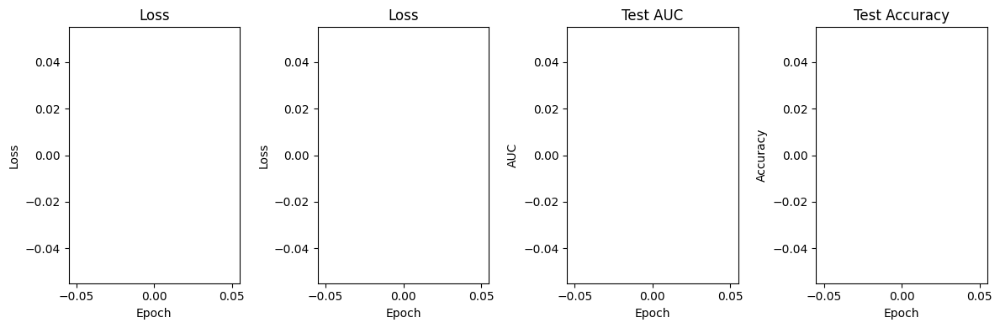

In [ ]:
# Plotting
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(sage_loss_history)
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.subplot(1, 4, 2)
plt.plot(sage_valid_loss_history)
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.subplot(1, 4, 3)
plt.plot(sage_valid_auc_history)
plt.title('Test AUC')
plt.xlabel('Epoch')
plt.ylabel('AUC')

plt.subplot(1, 4, 4)
plt.plot(sage_valid_acc_history)
plt.title('Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()